# The Evolution of Color Trends in Runway Fashion
#### Computer Vision Analysis of Milan Fashion Week 2013–2023
By Claire Ong. [View the presentation.](https://www.canva.com/design/DAGiDKWiibU/wNLNDfxsodpDIh7miGdxpg/view?utm_content=DAGiDKWiibU&utm_campaign=designshare&utm_medium=link2&utm_source=uniquelinks&utlId=hd68506096b)

## Context

Fashion is a powerful reflection of cultural, social, and economic shifts, and color plays a crucial role in shaping its visual language. Runway fashion, as seen in global fashion weeks, showcases the creative vision of designers and often sets the tone for industry-wide trends. Understanding how colors evolve over time can provide insight into shifting aesthetic preferences, broader fashion movements, and cultural influences across different regions.

This analysis is based on a random sample of 100 runway images per season from Milan Fashion Week over the period from 2013 to 2023, excluding 2021 due to a gap in the dataset. The analysis used Python and computer vision techniques to extract dominant colors from the images, followed by trend analysis to identify patterns and changes over time.

1. What are the most dominant colors in runway fashion over the last decade, and how do they vary between Spring-Summer and Fall-Winter seasons?
2. What colors are unique to each season, and how do they reflect the different moods and aesthetics of Spring-Summer versus Fall-Winter collections?
3. How have color trends in runway fashion evolved over the past decade, and which colors have become more or less common over time?
4. How do these findings compare with recent runway trends from Milan Spring-Summer and Fall-Winter 2025 collections?

## Data Setting

The project required significant cleaning and preprocessing to handle inconsistencies in the dataset. Metadata contained inconsistent naming conventions, missing values for designer names and seasons, and broken URLs. I used regular expressions to standardize file names, implemented logic to fill gaps in metadata, and built a repair function to fix or remove broken links. Additionally, I applied balanced sampling to address uneven data distribution, ensuring consistent sample sizes for each season and year. This work made the dataset reliable for meaningful analysis.

In [ ]:
# !pip install kagglehub[pandas-datasets]
# !pip install scikit-learn
# !pip install pandas
# !pip install requests
# !pip install pillow
# !pip install matplotlib
# !pip install numpy
# !pip install scipy
# !pip install webcolors
# !pip install plotly

import kagglehub
from kagglehub import KaggleDatasetAdapter
import pandas as pd
import requests
from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt
import re
import numpy as np
from sklearn.cluster import KMeans
from collections import Counter
from scipy.spatial import distance
import webcolors
import os
import plotly.express as px

In [1]:
import pandas as pd
import requests
from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt
import re
import numpy as np
from sklearn.cluster import KMeans
from collections import Counter
from scipy.spatial import distance
import webcolors
import os
import plotly.express as px
milan_colors = pd.read_csv('milan_colors.csv')

The dataset consists of approximately 132,000 images of runway looks from major fashion weeks, with metadata stored in collection_images_download.csv. Since the file did not explicitly label images by designer, season, or year, I extracted this information programmatically from the image_name column using pattern matching. During this process, I discovered missing data due to discrepancies in the image names, which required fixing common encoding issues.

In [ ]:
kaggle_data = kagglehub.load_dataset(
  KaggleDatasetAdapter.PANDAS,
  "martarelloelena/runways-from-major-brands-since-2011",
  "collection_images_download.csv"
)

def clean_kaggle_data(kaggle_data):
    """
    Clean common encoding issues and typos in the Kaggle dataset. Returns cleaned DataFrame.
    """
    kaggle_data["image_name"] = kaggle_data["image_name"].str.replace("%E2%80%94", "-", regex=True) # Fix em dash encoding
    kaggle_data["image_name"] = kaggle_data["image_name"].str.replace("Summmer", "Summer") # Fix typo in filenames
    kaggle_data["image_name"] = kaggle_data["image_name"].str.replace("_", "-") # Replace underscores with dashes
    kaggle_data["image_name"] = kaggle_data["image_name"].str.replace("fw", "Fall-Winter") # Convert "fw" to "Fall-Winter"
    kaggle_data["image_name"] = kaggle_data["image_name"].str.replace(r"(Fall-Winter)(\d{4})", r"\1-\2", regex=True) # Insert dash between Fall-Winter and year
    kaggle_data["image_name"] = kaggle_data["image_name"].str.replace(r"(Fashion-Show-Runway-)?(Paris|London|Milan|New-York|Seoul)-Fashion-Week", r"\2-Fashion-Week", regex=True) # Remove extra Fashion-Show-Runway
    
    return kaggle_data

def extract_metadata(image_name):
    """
    Extracts designer name, ready-to-wear, menswear/womenswear, season, year, and location from
    image_name. Returns tuple containing designer, ready-to-wear, menswear, womenswear, season,
    year, and location.
    """
    pattern = r"^(.*?)-(Ready-To-Wear)?-?(Menswear|Womenswear)?-?(Spring-Summer|Fall-Winter)?-(\d{4})-?(Paris|London|Milan|New-York|Seoul)?"
    simple_pattern = r"^([a-zA-Z-]+)-\d+"

    match = re.search(pattern, image_name, re.IGNORECASE)
    if match:
        designer = match.group(1).strip() if match.group(1) else None
        ready_to_wear = 1 if match.group(2) else 0
        menswear = 1 if match.group(3) == "Menswear" else 0
        womenswear = 1 if match.group(3) == "Womenswear" else 0
        season = match.group(4) if match.group(4) else None
        year = int(match.group(5)) if match.group(5) else None
        location = match.group(6) if match.group(6) else None
        return designer, ready_to_wear, menswear, womenswear, season, year, location

    fallback_match = re.match(simple_pattern, image_name)
    if fallback_match:
        designer = fallback_match.group(1)
        return designer, 0, 0, 0, None, None, None
    
    return None, 0, 0, 0, None, None, None

def process_kaggle_data(kaggle_data):
    """
    Load, clean, and extract metadata from Kaggle data. Returns cleaned Kaggle DataFrame with
    extracted metadata.
    """
    kaggle_data = clean_kaggle_data(kaggle_data)
    
    kaggle_data["designer"], kaggle_data["ready_to_wear"], kaggle_data["menswear"], kaggle_data["womenswear"], kaggle_data["season"], kaggle_data["year"], kaggle_data["location"] = zip(*kaggle_data["image_name"].apply(extract_metadata))

    missing_counts = kaggle_data[["designer", "ready_to_wear", "menswear", "womenswear", "season", "year", "location"]].isnull().sum()
    print("\n--- Missing Values in Extracted Metadata ---")
    print(missing_counts)

    return kaggle_data

cleaned_kaggle_data = process_kaggle_data(kaggle_data)

After cleaning the data, I counted the number of images for each location. Milan and Paris had the most images, with around 38,000 each, but Milan’s data was more complete. Milan was only missing data for 2021, while Paris was missing data from 2017 to 2021. Since the number of images per season and year ranged from 200 to 2000, I took a random sample of 100 images for each season and year to ensure balanced representation.

In [ ]:
milan_data = cleaned_kaggle_data[cleaned_kaggle_data['location'] == 'Milan'].copy()

def balance_milan_data(milan_data):
    """
    This function filters Milan fashion data for the years 2013 to 2023, then applies balanced
    sampling to ensure that each year-season combination has 100 entries. The balanced data is then
    saved to a new CSV file. If the file already exists, it prints a message and exits without
    overwriting the file.
    """
    if os.path.exists("balanced_milan_data.csv"):
        print("'balanced_milan_data.csv' already exists. Skipping data balancing.")
        return
    
    seed = 50
    target_size = 100
    
    target_milan_data = milan_data[
        (milan_data['year'] >= 2013) &
        (milan_data['year'] <= 2023)
    ]
    
    balanced_milan_data = target_milan_data.groupby(
        ["year", "season"], 
        group_keys=False
    ).apply(
        lambda x: x.sample(min(len(x), target_size), random_state=seed)
    ).reset_index(drop=True)
    
    print(balanced_milan_data.groupby(["year", "season"]).size())
    
    balanced_milan_data.to_csv("balanced_milan_data.csv", index=False)
    print("Balanced data saved to 'balanced_milan_data.csv'")

balance_milan_data(milan_data)

Some image URLs were broken due to size suffixes at the end of the links. I created a function to check each link and repair broken ones where possible.

In [ ]:
def check_links():
    """
    Check all links in balanced_milan_data.csv and save broken links to broken_links.csv.
    """
    if not os.path.exists("repaired_milan_data.csv"):
        original_data = pd.read_csv("balanced_milan_data.csv")
        original_data.to_csv("repaired_milan_data.csv", index=False)
        print("Created copy of balanced_milan_data.csv as repaired_milan_data.csv")

    fixed_data = pd.read_csv("repaired_milan_data.csv")
    
    if not os.path.exists("broken_links.csv"):
        print("All links are working. Exiting early.")
        return

    broken_links = pd.DataFrame(columns=fixed_data.columns)

    for index, row in fixed_data.iterrows():
        original_url = row["image_url"]

        try:
            response = requests.get(original_url, timeout=5)
            if response.status_code != 200:
                raise Exception("Broken link")
        except:
            broken_links = pd.concat([broken_links, pd.DataFrame([row])], ignore_index=True)

        if index % 100 == 0:
            print(f"Checked {index}/{len(fixed_data)} links")

    if not broken_links.empty:
        broken_links.to_csv("broken_links.csv", index=False)
        print(f"Found {len(broken_links)} broken links. Saved to 'broken_links.csv'")
    else:
        if os.path.exists("broken_links.csv"):
            os.remove("broken_links.csv")
        print("No broken links found.")

def repair_links():
    """
    Repair broken links from broken_links.csv by removing size suffixes and updating the main file.
    """
    if not os.path.exists("broken_links.csv"):
        print("No broken links to repair.")
        return

    fixed_data = pd.read_csv("repaired_milan_data.csv")
    broken_links = pd.read_csv("broken_links.csv")

    fixed_count = 0
    still_failed = []

    for index, row in broken_links.iterrows():
        original_url = row["image_url"]

        fixed_url = re.sub(r"-\d+x\d+(?=\..{3,4}$)", "", original_url)

        try:
            response = requests.get(fixed_url, timeout=5)
            if response.status_code == 200:
                # Fix link in the main file
                fixed_data.loc[fixed_data["image_url"] == original_url, "image_url"] = fixed_url
                fixed_count += 1
            else:
                raise Exception("Failed to fix link")
        except:
            still_failed.append(row)

        if index % 100 == 0:
            print(f"Processing link {index}/{len(broken_links)} — {fixed_count} links fixed so far.")

    fixed_data.to_csv("repaired_milan_data.csv", index=False)
    
    if still_failed:
        failed_data = pd.DataFrame(still_failed)
        failed_data.to_csv("broken_links.csv", index=False)
        print(f"{len(still_failed)} links could not be fixed and remain in 'broken_links.csv'")
    else:
        if os.path.exists("broken_links.csv"):
            os.remove("broken_links.csv")
        print("All broken links have been repaired.")

    print(f"Fixed {fixed_count} broken links.")

check_links()
repair_links()

The final milan_colors.csv includes added columns for the top five colors, their hex codes, and their percentage for each image, forming the basis for the trend analysis.

In [ ]:
def initialize_milan_colors():
    """
    Create a new copy of repaired_milan_data.csv called milan_colors.csv. Add new columns for
    color extraction and clustering results. Only create the file if it does not already exist.
    """
    if os.path.exists("milan_colors.csv"):
        print("'milan_colors.csv' already exists. Skipping initialization.")
        return
    
    fixed_data = pd.read_csv("repaired_milan_data.csv")

    for i in range(1, 6):
        fixed_data[f'color_{i}'] = None
        fixed_data[f'hex_{i}'] = None
        fixed_data[f'percentage_{i}'] = None
    fixed_data['n_clusters'] = None

    fixed_data = fixed_data.astype({
        **{f'color_{i}': 'object' for i in range(1, 6)},
        **{f'hex_{i}': 'object' for i in range(1, 6)},
        **{f'percentage_{i}': 'float64' for i in range(1, 6)},
        'n_clusters': 'float64'
    })

    fixed_data.to_csv("milan_colors.csv", index=False)

    print("Created 'milan_colors.csv' with clustering columns.")

initialize_milan_colors()

## Method

Since the dataset lacked labeled color information, I built a pipeline that interacted with the internet to retrieve images from URLs using the requests, crop them to reduce background noise, and cluster pixel data using Pillow and K-Means Clustering to identify the top five dominant colors. The extracted colors were standardized using Webcolors to ensure consistency. This process transformed unstructured image data into a structured dataset, enabling consistent analysis of color trends across seasons and years.

In [2]:
failed_urls = set()

web3_colors = {name: (webcolors.name_to_rgb(name), webcolors.CSS3_NAMES_TO_HEX[name]) 
               for name in webcolors.CSS3_NAMES_TO_HEX}

def closest_web3_color(requested_color):
    """
    Find and return the closest named CSS3 web color to a given RGB color.
    """
    requested = np.array(requested_color)
    colors = np.array([v[0] for v in web3_colors.values()])
    distances = np.linalg.norm(colors - requested, axis=1)
    closest_idx = np.argmin(distances)
    return list(web3_colors.keys())[closest_idx]

def load_and_crop_center(image_url, crop_width_fraction=0.3, crop_height_fraction=0.6):
    """
    Load an image from a URL and crop it to the center. Returns cropped image as a NumPy array, or
    None if loading fails.
    """
    if image_url in failed_urls:
        return None
    
    try:
        response = requests.get(image_url, timeout=5)
        response.raise_for_status()
        img = np.array(Image.open(BytesIO(response.content)))
    except Exception as e:
        print(f"Failed to load image {image_url}: {e}")
        failed_urls.add(image_url)
        return None
    
    h, w, _ = img.shape
    crop_h = int(h * crop_height_fraction)
    crop_w = int(w * crop_width_fraction)
    start_h = (h - crop_h) // 2
    start_w = (w - crop_w) // 2
    
    return img[start_h:start_h + crop_h, start_w:start_w + crop_w]

def extract_dominant_colors(image, k=5):
    """
    Extract the dominant colors from an image using K-Means clustering. Returns sorted_colors, an
    array of RGB values of dominant colors, and sorted_counts, an array of color percentages.
    """
    pixels = image.reshape((-1, 3))
    kmeans = KMeans(n_clusters=k, random_state=50)
    kmeans.fit(pixels)
    
    colors = kmeans.cluster_centers_.astype(int)
    labels = kmeans.labels_
    counts = np.bincount(labels)
    
    sorted_colors = colors[np.argsort(-counts)]
    sorted_counts = counts[np.argsort(-counts)] / sum(counts)
    
    return sorted_colors, sorted_counts

def update_csv_with_colors(season, year, data):
    """
    Update a CSV file with top 5 colors, their hex codes, and their percentages.
    """
    filtered_data = data.query('season == @season and year == @year')

    for index, row in filtered_data.iterrows():
        image_url = row['image_url']
        cropped_img = load_and_crop_center(image_url)

        if cropped_img is not None:
            colors, percentages = extract_dominant_colors(cropped_img)
            named_colors = [closest_web3_color(c) for c in colors]
            hex_colors = [f'#{c[0]:02x}{c[1]:02x}{c[2]:02x}' for c in colors]

            # Update the data in CSV
            for i in range(5):
                if i < len(named_colors):
                    data.at[index, f'color_{i+1}'] = named_colors[i]
                    data.at[index, f'hex_{i+1}'] = hex_colors[i]
                    data.at[index, f'percentage_{i+1}'] = percentages[i]
                else:
                    data.at[index, f'color_{i+1}'] = None
                    data.at[index, f'hex_{i+1}'] = None
                    data.at[index, f'percentage_{i+1}'] = None

            data.at[index, 'n_clusters'] = len(colors)

    data.to_csv('milan_colors.csv', index=False)

In [ ]:
# Run color extraction for all images and populate CSV
milan_colors = pd.read_csv('milan_colors.csv')

years = [year for year in range(2013, 2024) if year != 2021]

for year in years:
    for season in ['Spring-Summer', 'Fall-Winter']:
        print(f"Processing {season} {year}...")
        update_csv_with_colors(season, year, milan_colors)

print("Processing complete!")

Each image is retrieved using a URL from the dataset, cropped, and processed with K-Means clustering to extract five dominant colors. Each color is then matched to the closest Web3 color for standardized naming. For each image, the CSV is then populated with their top five colors, hex codes, and percentages.

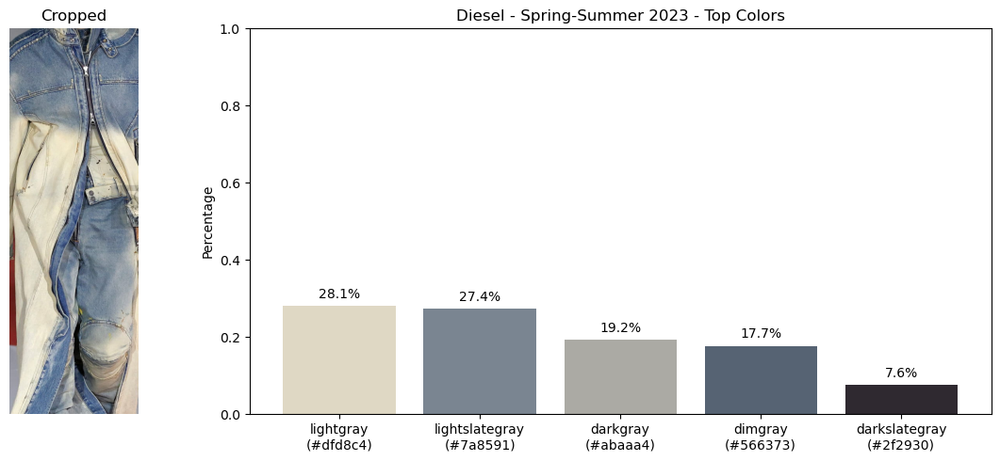

In [3]:
def demo_crop_and_colors(data):
    """
    Demonstrate image cropping and color extraction for a single row of data. Displays cropped
    image and color chart of top 5 colors extracted.
    """
    row = data.iloc[1998]
    image_url = row['image_url']
    season = row['season']
    year = row['year']
    designer = row['designer']

    cropped_img = load_and_crop_center(image_url)

    if cropped_img is not None:
        colors, percentages = extract_dominant_colors(cropped_img)
        named_colors = [closest_web3_color(c) for c in colors]  
        hex_colors = [f'#{c[0]:02x}{c[1]:02x}{c[2]:02x}' for c in colors] 

        fig, (ax_img, ax_colors) = plt.subplots(1, 2, figsize=(12, 5), gridspec_kw={'width_ratios': [1, 2]})
        
        ax_img.imshow(cropped_img)
        ax_img.axis('off')
        ax_img.set_title("Cropped")
        
        ax_colors.bar(named_colors[:5], percentages[:5], color=hex_colors[:5])
        
        for i, (color, percent) in enumerate(zip(named_colors[:5], percentages[:5])):
            ax_colors.text(i, percent + 0.02, f'{percent*100:.1f}%', ha='center', fontsize=10)

        xtick_labels = [f"{name}\n({hex})" for name, hex in zip(named_colors[:5], hex_colors[:5])]
        ax_colors.set_xticks(range(len(named_colors[:5])))
        ax_colors.set_xticklabels(xtick_labels, rotation=0, ha="center")
                    
        ax_colors.set_title(f"{designer} - {season} {int(year)} - Top Colors")
        ax_colors.set_ylabel("Percentage")
        ax_colors.set_ylim(0, 1)

        plt.tight_layout()
        plt.show()

    else:
        print(f"Failed to load image from {image_url}")

demo_crop_and_colors(milan_colors)

After extracting the top five colors and their percentages from each image, the frequency of each color across the season can be calculated. The results are shown in a bar chart of the top 10 most frequent colors for each season and year, supported by runway images reflecting the dominant colors.

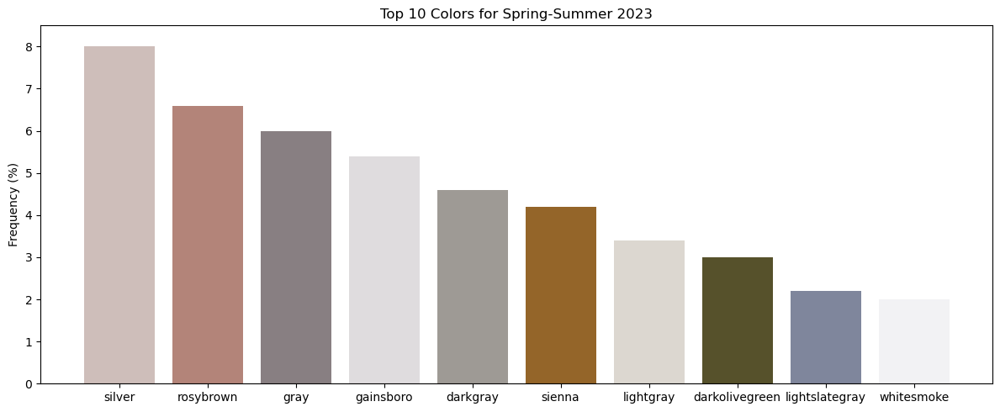

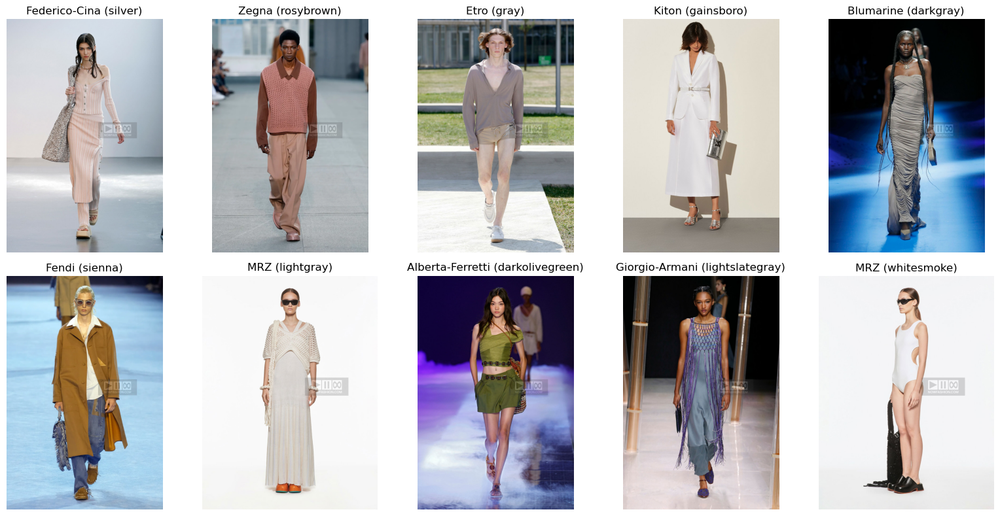

In [4]:
def get_top_colors(milan_colors, total_color_slots, excluded_colors=None):
    """
    Identifies the top 10 colors based on frequency, normalizes the values over the total available
    slots, and retrieves the highest-percentage image and designer associated with each color.
    """
    if excluded_colors:
        color_counts = milan_colors[['color_1', 'color_2', 'color_3', 'color_4', 'color_5']].stack().value_counts()
        color_counts = color_counts[~color_counts.index.isin(excluded_colors)].head(10)
    else:
        color_counts = milan_colors[['color_1', 'color_2', 'color_3', 'color_4', 'color_5']].stack().value_counts().head(10)
    
    color_counts = color_counts / total_color_slots * 100
    
    top_colors = color_counts.index
    hex_colors = []
    best_images = {}

    for color in top_colors:
        for i in range(1, 6):
            match = milan_colors.loc[milan_colors[f'color_{i}'] == color]
            if not match.empty:
                best_row = match.loc[match[f'percentage_{i}'].idxmax()]
                hex_color = best_row[f'hex_{i}']
                hex_colors.append(hex_color)
                best_images[color] = {
                    'image_url': best_row['image_url'],
                    'designer': best_row['designer'],
                    'hex': hex_color
                }
                break

    return color_counts, hex_colors, best_images

def plot_top_colors(milan_colors, title, total_color_slots, excluded_colors=None):
    """
    Generates a bar chart showing the top 10 colors based on frequency. It also displays the
    ≠highest-percentage image for each color in a 2x5 grid.
    """
    color_counts, hex_colors, best_images = get_top_colors(milan_colors, total_color_slots, excluded_colors)

    plt.figure(figsize=(12, 5))
    plt.bar(color_counts.index, color_counts.values, color=hex_colors)
    plt.title(title)
    plt.ylabel('Frequency (%)')
    plt.ylim(0, max(color_counts.values) + 0.5)
    plt.tight_layout()
    plt.show()

    fig, axs = plt.subplots(2, 5, figsize=(16, 8))
    axs = axs.flatten()

    for i, color in enumerate(color_counts.index):
        try:
            img_url = best_images[color]['image_url']
            designer = best_images[color]['designer']
            hex_color = best_images[color]['hex']

            response = requests.get(img_url, timeout=5)
            response.raise_for_status()
            img = Image.open(BytesIO(response.content))

            axs[i].imshow(img)
            axs[i].axis('off')
            axs[i].set_title(f"{designer} ({color})")
        except Exception:
            axs[i].axis('off')
            axs[i].set_title(f"{color} (Image Not Available)")

    plt.tight_layout()
    plt.show()

spring_2023 = milan_colors[(milan_colors['season'] == 'Spring-Summer') & (milan_colors['year'] == 2023)]
plot_top_colors(spring_2023, "Top 10 Colors for Spring-Summer 2023", 500, excluded_colors=["black", "darkslategray", "dimgray"]) # 100images x 5colors

The horizontal stacked bar chart compares seasonal color trends over the decade, showing the top 10 most frequent colors for each year, divided into Spring-Summer and Fall-Winter. Colors are arranged from most to least frequent (left to right). Black, darkslategray, and dimgray are excluded as they consistently rank among the top three every season.

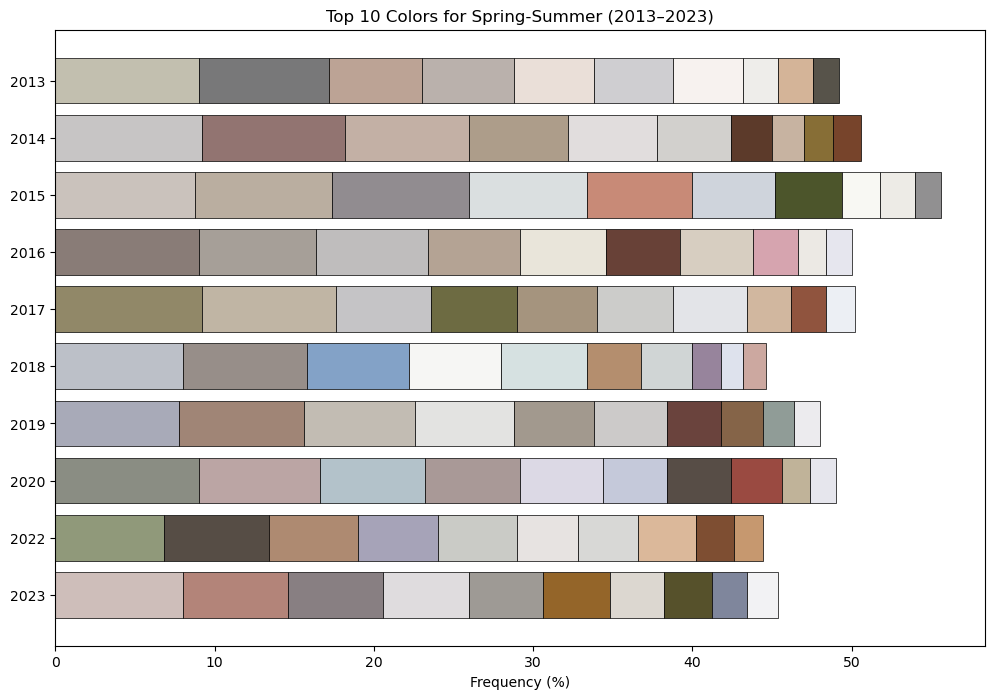

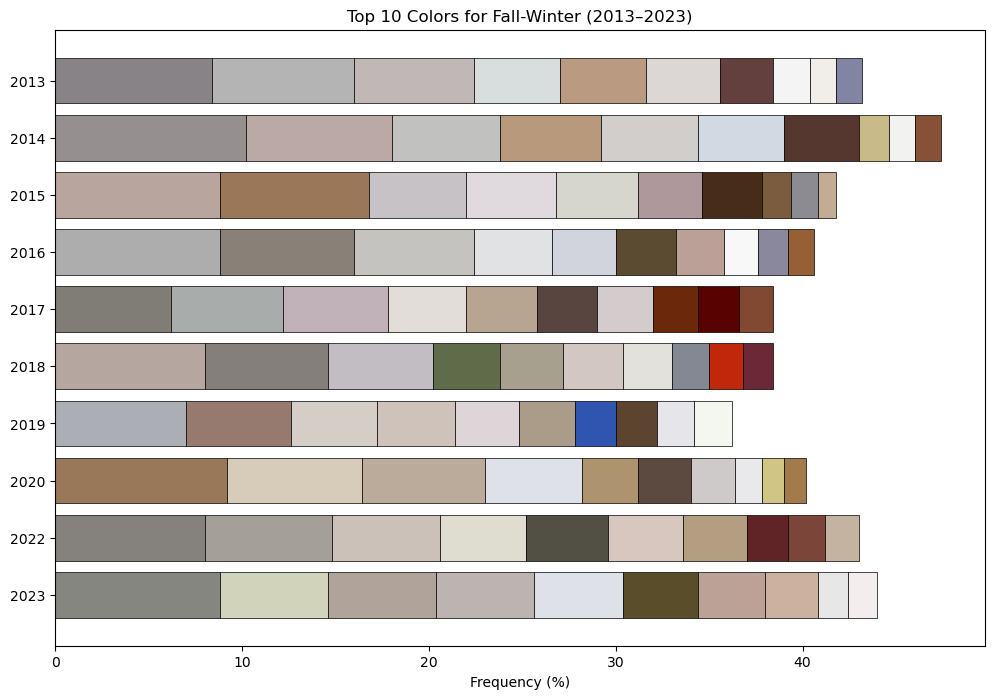

In [5]:
def plot_stacked_top_colors(milan_colors, total_color_slots, excluded_colors=None):
    """
    Creates two horizontal stacked bar charts showing the top 10 colors per year for Spring-Summer
    and Fall-Winter seasons. The colors are arranged from most to least frequent for each year. 
    """
    spring_data = milan_colors[milan_colors['season'].str.contains('Spring', case=False)]
    fall_data = milan_colors[milan_colors['season'].str.contains('Fall', case=False)]

    def plot_season(milan_colors, title):
        top_colors = {}
        hex_colors = {}

        years = sorted(milan_colors['year'].unique())

        for year in years:
            filtered_data = milan_colors[milan_colors['year'] == year]
            color_counts, hex_list, _ = get_top_colors(filtered_data, total_color_slots, excluded_colors)
            top_colors[year] = color_counts.values
            hex_colors[year] = hex_list

        fig, ax = plt.subplots(figsize=(12, 8))

        for i, year in enumerate(years):
            left = 0
            for j in range(10):
                value = top_colors[year][j]
                color = hex_colors[year][j]
                ax.barh(i, value, color=color, left=left, edgecolor='black', linewidth=0.5)
                left += value

        ax.set_title(title)
        ax.set_xlabel('Frequency (%)')
        ax.set_yticks(range(len(years)))
        ax.set_yticklabels([str(int(year)) for year in years])
        plt.gca().invert_yaxis()
        plt.show() 

    plot_season(spring_data, "Top 10 Colors for Spring-Summer (2013–2023)")
    plot_season(fall_data, "Top 10 Colors for Fall-Winter (2013–2023)")

plot_stacked_top_colors(milan_colors, 500, excluded_colors=["black", "darkslategray", "dimgray"])

## Result

### 1. What are the most dominant colors in runway fashion over the last decade, and how do they vary between Spring-Summer and Fall-Winter seasons?

Neutral shades like **darkslategray** (16.50%), **black** (12.72%), and **dimgray** (10.29%) have consistently dominated all seasons, reflecting the fashion industry's preference for timelss and versatile palettes. In Spring-Summer, softer shades such as **lavender** (1.30%) and **lightslategray** (1.34%) are more prominent, reflecting the lighter, breezier feel of warm-weather collections. In Fall-Winter, richer and deeper tones like **maroon** (0.70%) and **firebrick** (0.68%) dominate, adding warmth and depth to cold-weather palettes. Additionally, **darkslategray** and **black** show a clear seasonal peak in Fall-Winter, reinforcing the association of darker tones with colder months.

Note that the top 10 most frequent colors across the decade are excluded from the displays of the top 10 colors for Spring-Summer and Fall-Winter.

In [6]:
def load_data(milan_colors):
    """
    Melts the color columns into a long format, creating a structured DataFrame containing color
    information for each season and year. It also separates the data into Spring-Summer and 
    Fall-Winter sets. Returns the three DataFrames for for seasonal analysis.
    """
    color_columns = [col for col in milan_colors.columns if col.startswith('color')]
    
    color_trends = milan_colors.melt(
        id_vars=['season', 'year'],
        value_vars=color_columns,
        value_name='color'
    ).dropna()

    ss_colors = color_trends.query("season == 'Spring-Summer'")
    fw_colors = color_trends.query("season == 'Fall-Winter'")
    
    return color_trends, ss_colors, fw_colors

color_trends, ss_colors, fw_colors = load_data(milan_colors)

def get_timeless_tones(color_trends):
    """
    Calculates the most frequently used colors in the dataset and returns the top 10 colors by
    occurrence.
    """
    return color_trends['color'].value_counts().nlargest(10).index.tolist()

def get_top_colors_by_season(colors, timeless_tones):
    """
    Calculates the frequency of colors within a specific season and returns the top 10 colors,
    excluding any timeless tones.
    """
    top_colors = (
        colors.loc[~colors['color'].isin(timeless_tones), 'color']
        .value_counts()
        .div(5000)
        .mul(100)
        .nlargest(10)
    )
    return top_colors

def display_colors(title, data):
    """
    Display the top color data in a readable format.
    """
    print(f"\n--- {title} ---")
    if not data.empty:
        for color, value in data.items():
            print(f"{color}: {value:.2f}%")
    else:
        print("No data available.")

timeless_tones = get_timeless_tones(color_trends)
timeless_tones_percentage = (
    color_trends['color'].value_counts(normalize=True).loc[timeless_tones] * 100
)

display_colors("Top 10 Most Frequent Colors Across the Decade", timeless_tones_percentage)

top_colors_ss = get_top_colors_by_season(ss_colors, timeless_tones)
top_colors_fw = get_top_colors_by_season(fw_colors, timeless_tones)

display_colors("Top 10 Colors for Spring-Summer (2013–2023)", top_colors_ss)
display_colors("Top 10 Colors for Fall-Winter (2013–2023)", top_colors_fw)


--- Top 10 Most Frequent Colors Across the Decade ---
darkslategray: 16.50%
black: 12.72%
dimgray: 10.29%
gray: 7.98%
darkgray: 7.13%
silver: 6.60%
gainsboro: 4.85%
rosybrown: 4.61%
lightgray: 4.16%
darkolivegreen: 3.49%

--- Top 10 Colors for Spring-Summer (2013–2023) ---
whitesmoke: 2.20%
sienna: 2.00%
tan: 1.98%
linen: 1.36%
lightslategray: 1.34%
lavender: 1.30%
saddlebrown: 1.14%
darkslateblue: 0.92%
indianred: 0.86%
slategray: 0.74%

--- Top 10 Colors for Fall-Winter (2013–2023) ---
whitesmoke: 1.46%
sienna: 1.44%
tan: 1.32%
lightslategray: 1.26%
saddlebrown: 1.14%
lavender: 1.12%
linen: 0.98%
darkslateblue: 0.80%
maroon: 0.70%
firebrick: 0.68%


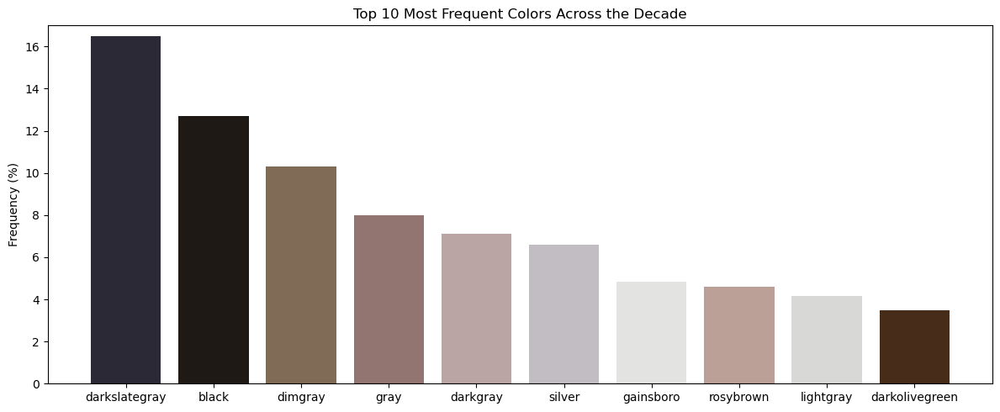

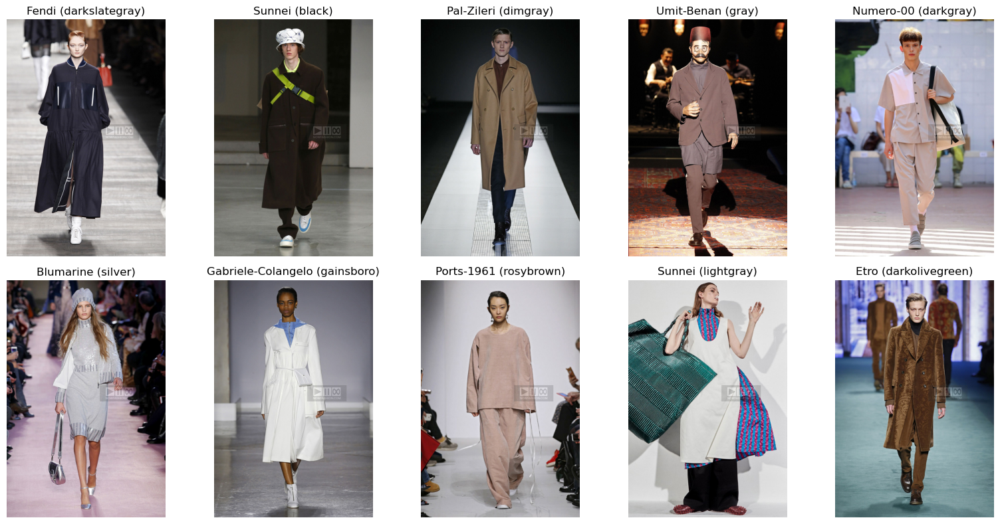

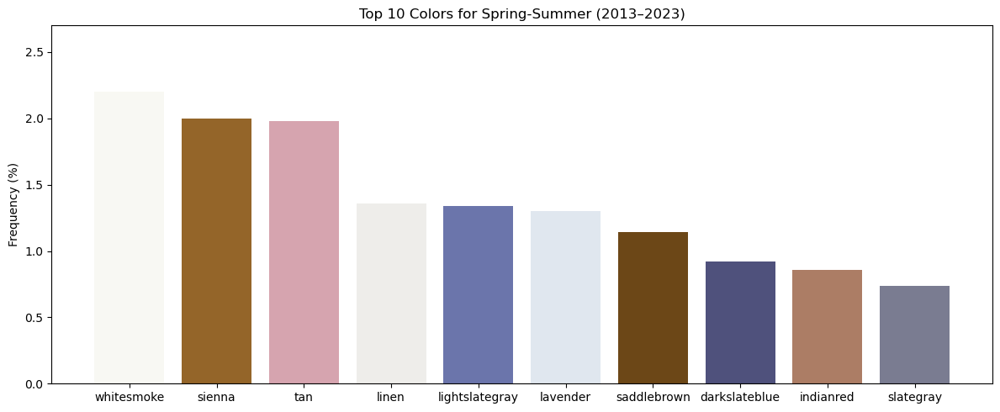

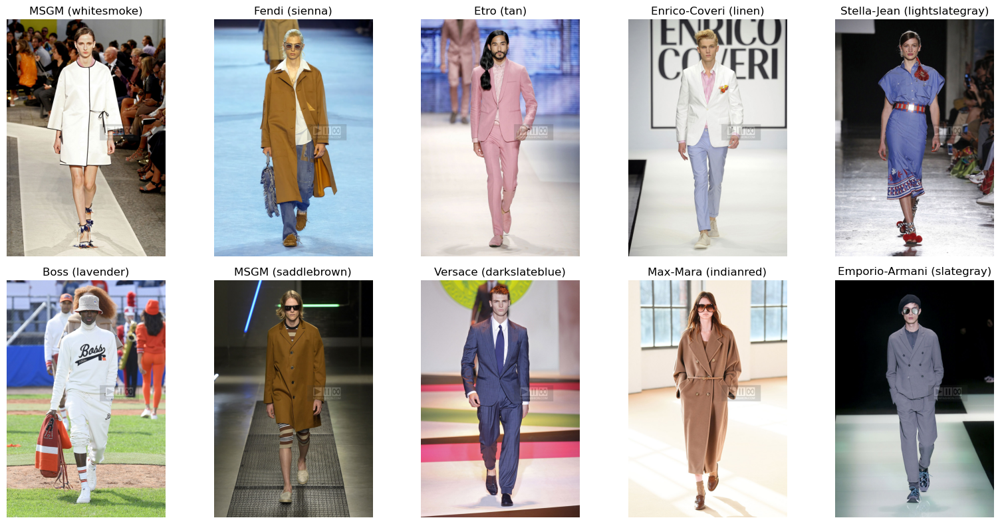

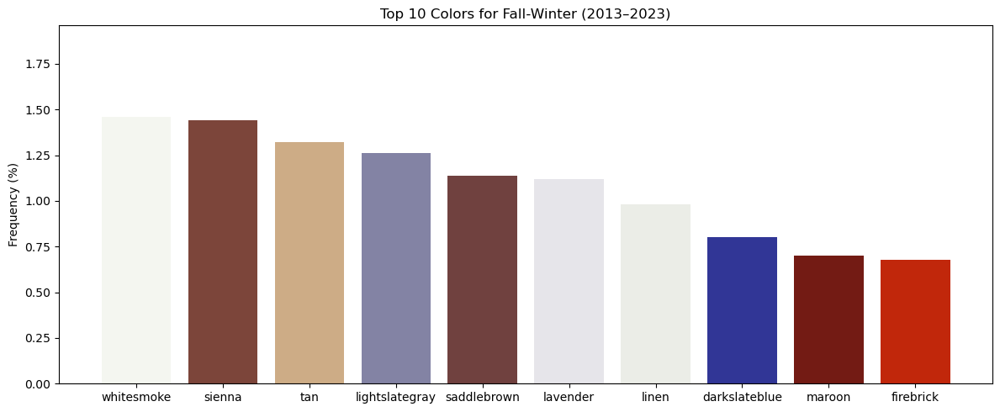

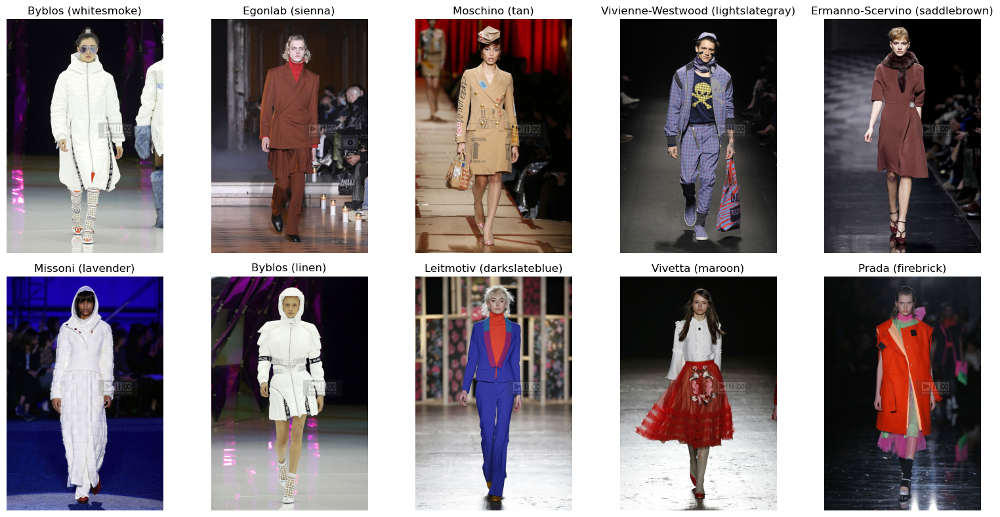

In [7]:
plot_top_colors(milan_colors, "Top 10 Most Frequent Colors Across the Decade", 10000) # 2seasons x 10years 100images x 5colors

spring_data = milan_colors[milan_colors['season'] == 'Spring-Summer']
plot_top_colors(spring_data, "Top 10 Colors for Spring-Summer (2013–2023)", 5000, timeless_tones) # 10years x 100images x 5colors

fall_data = milan_colors[milan_colors['season'] == 'Fall-Winter']
plot_top_colors(fall_data, "Top 10 Colors for Fall-Winter (2013–2023)", 5000, timeless_tones)

### 2. What colors are unique to each season, and how do they reflect the different moods and aesthetics of Spring-Summer versus Fall-Winter collections?

Certain colors are exclusive to each season, reinforcing the distinct mood and character of Spring-Summer versus Fall-Winter collections. Bright, vibrant shades like **peachpuff**, **lemonchiffon**, and **lightgreen** appear only in Spring-Summer, reflecting the playful and airy feel of warm-weather collections. In contrast, jewel tones like **indigo**, **gold**, and **darkviolet** and icy colors like **aliceblue** are unique to Fall-Winter, emphasizing richness and coolness suited to colder months. This seasonal contrast highlights how designers use color to evoke different atmospheres and seasonal identities.

In [8]:
def get_unique_colors(ss_colors, fw_colors):
    """
    Compares the colors used in Spring-Summer and Fall-Winter seasons and returns the colors that
    appear in one season but not the other.
    """
    ss_unique = set(ss_colors['color']).difference(fw_colors['color'])
    fw_unique = set(fw_colors['color']).difference(ss_colors['color'])
    
    return sorted(ss_unique), sorted(fw_unique)
    
unique_to_ss, unique_to_fw = get_unique_colors(ss_colors, fw_colors)
print(f"\n--- Colors Unique to Spring-Summer ---\n{', '.join(unique_to_ss)}")
print(f"\n--- Colors Unique to Fall-Winter ---\n{', '.join(unique_to_fw)}")


--- Colors Unique to Spring-Summer ---
blueviolet, darkcyan, darkgreen, deeppink, forestgreen, lemonchiffon, lightcoral, lightgoldenrodyellow, lightgreen, lightseagreen, mediumslateblue, navajowhite, orange, orchid, peachpuff, powderblue, seashell, slateblue, tomato

--- Colors Unique to Fall-Winter ---
aliceblue, darkorange, darkviolet, gold, indigo, mediumaquamarine, mintcream, olive, yellowgreen


### 3. How have color trends in runway fashion evolved over the past decade, and which colors have become more or less common over time?

Warm, earthy tones have seen a significant rise in popularity: In Spring-Summer, colors like **slategray** (+80.95%), **sienna** (+79.86%), and **saddlebrown** (+54.45%) have become increasingly prominent, reflecting a growing preference for organic, grounded hues. In Fall-Winter, **peru** (+50.37%), **maroon** (+43.97%), and **brown** (+40.93%) have experienced similar increases, reinforcing the trend toward natural and sophisticated palettes.

Bright and saturated hues have sharply declined: **Deeppink** and **orchid** have completely disappeared from Spring-Summer collections. **Floralwhite** has dropped out of Fall-Winter collections, and shades like gray and darkslategray have shown moderate declines.

This shift reflects a broader move away from bold, attention-grabbing colors in favor of more understated, versatile shades that align with the rise of minimalism and sustainable fashion.

In [9]:
def calculate_color_trends(colors):
    """
    Calculates the percentage change in color popularity across years. Returns the top 10
    increasing and decreasing colors based on average percentage change.
    """
    trends = colors.groupby(['year', 'color']).size().reset_index(name='count')
    pivot = trends.pivot(index='year', columns='color', values='count').fillna(0)
    
    percentage = pivot.div(pivot.sum(axis=1), axis=0) * 100
    
    avg_change = percentage.pct_change().mean().replace([np.inf, -np.inf], np.nan).dropna()
    
    top_increasing = avg_change.sort_values(ascending=False).head(10)
    top_decreasing = avg_change[avg_change < 0].sort_values(ascending=True).head(10)
    
    return top_increasing, top_decreasing
    
def display_trends(title, increasing, decreasing):
    """
    Display the top increasing and decreasing color trends.
    """
    print(f"\n--- {title} ---")

    print("\nIncreasing:")
    for color, change in increasing.items():
        print(f"{color}: +{change * 100:.2f}%")

    print("\nDecreasing:")
    for color, change in decreasing.items():
        print(f"{color}: {change * 100:.2f}%")
        
top_increasing_ss, top_decreasing_ss = calculate_color_trends(ss_colors)
top_increasing_fw, top_decreasing_fw = calculate_color_trends(fw_colors)

display_trends("Spring-Summer Color Trends", top_increasing_ss, top_decreasing_ss)
display_trends("Fall-Winter Color Trends", top_increasing_fw, top_decreasing_fw)


--- Spring-Summer Color Trends ---

Increasing:
slategray: +80.95%
sienna: +79.86%
peru: +63.52%
saddlebrown: +54.45%
darkolivegreen: +37.51%
lightslategray: +35.78%
whitesmoke: +27.91%
firebrick: +26.67%
tan: +16.64%
indianred: +13.06%

Decreasing:
deeppink: -100.00%
orchid: -100.00%
gray: -2.65%
dimgray: -2.57%
lightgray: -2.26%
darkgray: -0.27%

--- Fall-Winter Color Trends ---

Increasing:
peru: +50.37%
maroon: +43.97%
brown: +40.93%
saddlebrown: +40.88%
firebrick: +40.37%
whitesmoke: +29.99%
indianred: +26.53%
tan: +24.94%
sienna: +21.28%
lavender: +17.57%

Decreasing:
floralwhite: -100.00%
antiquewhite: -1.85%
darkslategray: -1.54%
darkgray: -1.44%
rosybrown: -0.01%


The line chart shows how darkslategray and black dominate other colors in frequency, peaking sharply during Fall-Winter seasons. This creates a distinct pattern of peaks and valleys, highlighting a consistent preference for darker tones in colder months and reinforcing the cyclical nature of fashion color trends.

In [10]:
def plot_colors_over_time(milan_colors):
    """
    Reads color data from a CSV, calculates the frequency of each color by year and season, and
    plots the trends in a line chart. The x-axis shows alternating Spring-Summer (SS) and
    Fall-Winter (FW) seasons for each year, and the y-axis represents the normalized frequency
    based on the total available slots per season.
    """
    milan_colors = pd.read_csv(milan_colors)

    colors = milan_colors.melt(
        id_vars=['year', 'season'],
        value_vars=['color_1', 'color_2', 'color_3', 'color_4', 'color_5'],
        var_name='color_rank',
        value_name='color'
    )

    hex_colors = milan_colors.melt(
        id_vars=['year', 'season'],
        value_vars=['hex_1', 'hex_2', 'hex_3', 'hex_4', 'hex_5'],
        var_name='hex_rank',
        value_name='hex'
    )

    combined = pd.concat([colors[['year', 'season', 'color']], hex_colors[['hex']]], axis=1)

    combined['year'] = combined['year'].astype(int)

    combined['Season-Year'] = combined['season'].replace({
        'Spring-Summer': 'SS',
        'Fall-Winter': 'FW'
    }) + ' ' + combined['year'].astype(str)

    color_map = combined.groupby('color')['hex'].first().to_dict()

    color_trends = combined.groupby(['Season-Year', 'color']).size().reset_index(name='count')

    color_trends['count'] = color_trends.groupby('Season-Year')['count'].transform(lambda x: x / 500 * 100)

    color_trends = color_trends.rename(
        columns={
            'Season-Year': 'Season-Year',
            'count': 'Frequency (%)',
            'color': 'Color'
        }
    )

    total_frequency = color_trends.groupby('Color')['Frequency (%)'].sum().sort_values(ascending=False)
    sorted_colors = total_frequency.index.tolist()

    color_trends['Color'] = pd.Categorical(
        color_trends['Color'], 
        categories=sorted_colors, 
        ordered=True
    )

    order = []
    for year in sorted(milan_colors['year'].unique().astype(int)):
        order.append(f"SS {year}")
        order.append(f"FW {year}")

    color_trends['Season-Year'] = pd.Categorical(
        color_trends['Season-Year'],
        categories=order,
        ordered=True
    )

    color_trends = color_trends.sort_values(by=['Season-Year', 'Color'])

    fig = px.line(
        color_trends,
        x='Season-Year',
        y='Frequency (%)',
        color='Color',
        title='Color Trends Over Time',
        color_discrete_map=color_map
    )

    fig.show()

In [11]:
plot_colors_over_time('milan_colors.csv')

### 4. How do these findings compare with recent runway trends from Milan Spring-Summer and Fall-Winter 2025 collections?

In Spring-Summer 2025, **black** (32.4%), **white** (22.5%), **brown** (6.7%), and **cream** (5%) dominated, reinforcing the decade-long consistency of **black** (12.75%), **whitesmoke** (2.20%), **tan** (1.98%), and **linen** (1.36%) as staple colors. **Orange** appeared in earthy to neon shades, after showing up in only two looks in 2022, suggesting it may be a fleeting or cyclical trend.

In Fall-Winter 2025, **fiery reds** and **deep burgundy** tones stood out, aligning with the rise of **maroon** (+43.97%) and **firebrick** (+40.37%) over the decade. **Rich browns**, **moss greens**, and **deep ochres** were widely used, reflecting the rise of **brown** (+40.93%), **saddlebrown** (+40.88%), and **darkolivegreen** (+37.51%). **Mustard**, **chartreuse**, and **bright yellow** emerged but have limited data, suggesting they may signal an early trend rather than an established staple.

Overall, neutral and earthy tones remain long-term staples, while bolder colors may reflect seasonal experimentation rather than a lasting shift.

Sources: [Adebayo](https://woveninsights.ai/site-blog/the-milan-fashion-week-ss25-report/), [Poliziani](https://graziamagazine.com/us/articles/milan-fashion-week-fw25-trends/), [Sessoms](https://fashionista.com/2024/09/milan-fashion-week-spring-2025-trends)

## Limitation

While the analysis highlights key color trends, the results should be interpreted with caution due to data limitations and classification challenges. The dataset includes 271 unique designers across all seasons, but some seasons have limited representation (e.g., Spring-Summer 2018 with only 11 designers). Collections are often cohesive, so overrepresentation of certain designers (e.g., Emporio-Armani with 45 designs) can skew the overall color analysis. 

Despite cropping images, background colors, skin tones, and lighting inconsistencies were sometimes misclassified as part of the design. K-Means clustering simplifies color classification, and mapping to the closest Web3 color reduces nuance, overlooking subtle color variations Expanding the dataset and improving color extraction methods would enhance future trend analysis.

Next, I plan to use Convolutional Neural Networks to predict future dominant colors. Initial tests with Random Forest, Linear Regression, ARIMA, and Prophet were inconsistent due to data complexity, leading me to focus on clustering and visualizations for deeper trend analysis. While predictive modeling is ongoing, the structured data and insights provide a solid foundation for future forecasts.

This analysis provides valuable insights for fashion designers, trend forecasters, and retailers looking to align their collections with emerging color trends or make a bold statement. Fashion historians and cultural analysts could use the findings to explore how color trends reflect broader social, cultural, and economic shifts. Ultimately, understanding these patterns empowers both creatives and analysts to navigate the evolving landscape of fashion with greater insight and strategic clarity.

In [12]:
print("From milan_colors.csv...")

num_designers = milan_colors['designer'].nunique()
print(f"Total unique designers across all years and seasons: {num_designers}")

designers_by_season = milan_colors.groupby('season')['designer'].nunique().reset_index()
print("\nUnique designers by season (across all years)")
print(designers_by_season)

designers_per_season = milan_colors.groupby(['year', 'season'])['designer'].nunique().reset_index()

max_designers = designers_per_season.loc[designers_per_season['designer'].idxmax()]
min_designers = designers_per_season.loc[designers_per_season['designer'].idxmin()]

print("\nHighest number of designers in a season:")
print(f"{max_designers['season']} {int(max_designers['year'])} – {max_designers['designer']} designers")

print("\nLowest number of designers in a season:")
print(f"{min_designers['season']} {int(min_designers['year'])} – {min_designers['designer']} designers")

designer_representation = milan_colors['designer'].value_counts()

most_represented_designer = designer_representation.idxmax()
most_represented_count = designer_representation.max()

least_represented_designer = designer_representation.idxmin()
least_represented_count = designer_representation.min()

print("\nMost represented designer (highest total designs):")
print(f"{most_represented_designer} – {most_represented_count} designs")

print("\nThank you for reading!")

From milan_colors.csv...
Total unique designers across all years and seasons: 271

Unique designers by season (across all years)
          season  designer
0    Fall-Winter       210
1  Spring-Summer       200

Highest number of designers in a season:
Fall-Winter 2022 – 64 designers

Lowest number of designers in a season:
Spring-Summer 2018 – 11 designers

Most represented designer (highest total designs):
Emporio-Armani – 45 designs

Thank you for reading!


You have reached the end. [View the presentation.](https://www.canva.com/design/DAGiDKWiibU/wNLNDfxsodpDIh7miGdxpg/view?utm_content=DAGiDKWiibU&utm_campaign=designshare&utm_medium=link2&utm_source=uniquelinks&utlId=hd68506096b)